# AutoGluon Vision 101

In [1]:
%matplotlib inline
import os
import pandas as pd
import autogluon.core as ag
from autogluon.vision import ImagePredictor, ObjectDetector
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

## 1. Image Classification

### 1.1 Image Datasets

#### 1.1.1 CSV
Any tabular data with `image` (absolute or relative paths to images) and `label` (category for each image) columns are naturally supported by AutoGluon.vision

In [2]:
csv_file = ag.utils.download('https://autogluon.s3-us-west-2.amazonaws.com/datasets/petfinder_example.csv')
df = pd.read_csv(csv_file)
df.sample(5, random_state=123)

,image,PetID,label
10216,petfinder_data/train_images/d0b5fece1-1.jpg,d0b5fece1,3
14913,petfinder_data/train_images/fb9474822-1.jpg,fb9474822,4
14759,petfinder_data/train_images/f246dec63-1.jpg,f246dec63,4
3901,petfinder_data/train_images/1a1e3aa63-1.jpg,1a1e3aa63,2
12059,petfinder_data/train_images/49d4a0adf-1.jpg,49d4a0adf,4


Tips: if the image paths are not relative to current working directory, you may use the helper function to prepend prefix for each image, using absolute paths can reduce the chance of OSError happening to file access

In [3]:
df = ImagePredictor.Dataset.from_csv(csv_file, root=os.getcwd())
df.sample(5, random_state=123)

,image,PetID,label
10216,/home/ec2-user/SageMaker/petfinder_data/train_...,d0b5fece1,3
14913,/home/ec2-user/SageMaker/petfinder_data/train_...,fb9474822,4
14759,/home/ec2-user/SageMaker/petfinder_data/train_...,f246dec63,4
3901,/home/ec2-user/SageMaker/petfinder_data/train_...,1a1e3aa63,2
12059,/home/ec2-user/SageMaker/petfinder_data/train_...,49d4a0adf,4


#### 1.1.2 Image Folders
Image folder is another common format for organizing images, where images are explicitly labeled by their hierachical directory names. Recursively loop through images is tedious. You can use ImagePredictor.Dataset.from_folders or ImagePredictor.Dataset.from_folder to avoid implementing recursive search.

The difference between from_folders and from_folder is the targeting folder structure. If you have a folder with splits, e.g., train, test, like:

- root/train/car/0001.jpg

- root/train/car/xxxa.jpg

- root/val/bus/123.png

- root/test/bus/023.jpg


In [4]:
train_data, _, test_data = ImagePredictor.Dataset.from_folders(
    'https://autogluon.s3.amazonaws.com/datasets/shopee-iet.zip',
    train='train', test='test')
print('train #', len(train_data), 'test #', len(test_data))
train_data.sample(5, random_state=123)

data/
├── test/
└── train/
train # 800 test # 80


,image,label
145,/home/ec2-user/.gluoncv/datasets/shopee-iet/da...,0
571,/home/ec2-user/.gluoncv/datasets/shopee-iet/da...,2
229,/home/ec2-user/.gluoncv/datasets/shopee-iet/da...,1
202,/home/ec2-user/.gluoncv/datasets/shopee-iet/da...,1
185,/home/ec2-user/.gluoncv/datasets/shopee-iet/da...,0


Or a folder without train or test root folders, like:

- root/car/0001.jpg

- root/car/xxxa.jpg

- root/bus/123.png

- root/bus/023.jpg

which can be loaded with `from_folder`:

In [5]:
# use the train from shopee-iet as new root
root = os.path.join(os.path.dirname(train_data.iloc[0]['image']), '..')
all_data = ImagePredictor.Dataset.from_folder(root)
all_data.sample(5, random_state=123)

,image,label
145,/home/ec2-user/.gluoncv/datasets/shopee-iet/da...,0
571,/home/ec2-user/.gluoncv/datasets/shopee-iet/da...,2
229,/home/ec2-user/.gluoncv/datasets/shopee-iet/da...,1
202,/home/ec2-user/.gluoncv/datasets/shopee-iet/da...,1
185,/home/ec2-user/.gluoncv/datasets/shopee-iet/da...,0


#### 1.1.3 Convert from any label format via label function
We show that autogluon can create image dataset from any format using an example from the Oxford-IIIT Pet Dataset. Here all images are scattered in a single images directory but with unique pattern: filenames of cat starts with capital letter, otherwise dogs. So we can use a function to distinguish and assign label to each image:

In [6]:
pets = ag.utils.download('https://autogluon.s3-us-west-2.amazonaws.com/datasets/oxford-iiit-pet-mini.zip')
pets = ag.utils.unzip(pets)

In [7]:
image_list = [x for x in os.listdir(os.path.join(pets, 'images')) if x.endswith('jpg')]
def label_fn(x):
    return 'cat' if os.path.basename(x)[0].isupper() else 'dog'
new_data = ImagePredictor.Dataset.from_name_func(image_list,
                                                 label_fn,
                                                 root=os.path.join(os.getcwd(), pets, 'images'))
train, val, test = new_data.random_split(val_size=0.1, test_size=0.1)
print(new_data.iloc[0]['image'], new_data.iloc[0]['label'])
print(new_data.iloc[1]['image'], new_data.iloc[1]['label'])

/home/ec2-user/SageMaker/oxford-iiit-pet/images/american_bulldog_132.jpg 0
/home/ec2-user/SageMaker/oxford-iiit-pet/images/Siamese_129.jpg 1


### 1.2 Visualize images
We show how easily we can visualize the samples in dataset

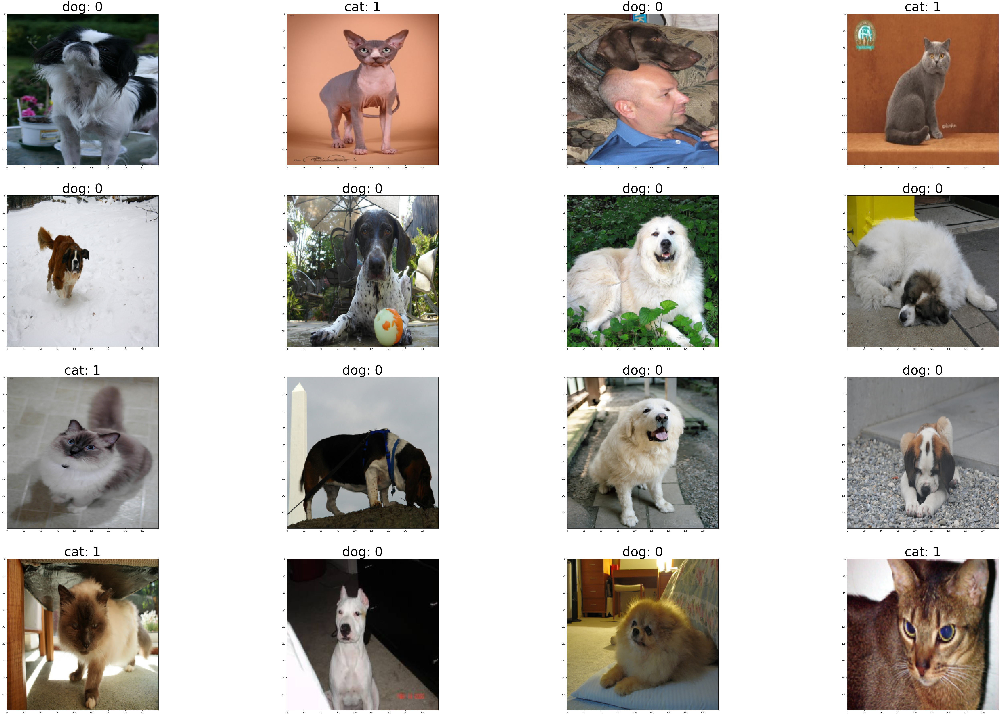

In [8]:
new_data.show_images(fontsize=64)

### 1.3 Why tabular dataset matters
The benefits of tabular based image dataset are three-fold:
- Creating a tabular format for image dataset makes it super easy to examine the data
- With abstract image path, scalability of the tabular dataset is superior. You can easily manipulate sets of billions of images
- It opens the gate for integration with other models, which we will be showing later

### 1.4 fit a model in one line

In [9]:
predictor = ImagePredictor().fit(train, val)

INFO:root:`time_limit=auto` set to `time_limit=7200`.
INFO:gluoncv.auto.tasks.image_classification:Starting fit without HPO
INFO:ImageClassificationEstimator:modified configs(<old> != <new>): {
INFO:ImageClassificationEstimator:root.gpus            (0,) != (0, 1, 2, 3)
INFO:ImageClassificationEstimator:root.valid.num_workers 4 != 32
INFO:ImageClassificationEstimator:root.valid.batch_size 128 != 16
INFO:ImageClassificationEstimator:root.img_cls.model   resnet50_v1 != resnet50_v1b
INFO:ImageClassificationEstimator:root.train.num_workers 4 != 32
INFO:ImageClassificationEstimator:root.train.batch_size 128 != 16
INFO:ImageClassificationEstimator:root.train.rec_train_idx ~/.mxnet/datasets/imagenet/rec/train.idx != auto
INFO:ImageClassificationEstimator:root.train.num_training_samples 1281167 != -1
INFO:ImageClassificationEstimator:root.train.rec_val   ~/.mxnet/datasets/imagenet/rec/val.rec != auto
INFO:ImageClassificationEstimator:root.train.rec_val_idx ~/.mxnet/datasets/imagenet/rec/val.idx

### 1.5 Predict probabilities or image embeddings
Predict is another single call function, with pre-process/post-process included:

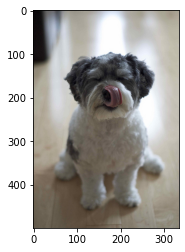

In [10]:
import matplotlib.image as mpimg
test_img = test.iloc[1]['image']
img = mpimg.imread(test_img)
plt.imshow(img)

In [11]:
prediction = predictor.predict(test_img)
print('pred of', test_img, 'is:')
prediction

pred of /home/ec2-user/SageMaker/oxford-iiit-pet/images/havanese_50.jpg is:


,class,score,id
0,dog,0.893379,0


`predict` supports multiple images in pandas DataFrame, similar to extracting features of multiple images

In [12]:
features = predictor.predict_feature(test)
features

/home/ec2-user/anaconda3/envs/mxnet_p36/lib/python3.6/site-packages/mxnet/gluon/block.py:758: UserWarning: Parameter dense2_bias, dense2_weight is not used by any computation. Is this intended?
  out = self.forward(*args)


,image_feature,image
10,"[0.03765934, 0.0, 0.005814111, 0.7001791, 0.39...",/home/ec2-user/SageMaker/oxford-iiit-pet/image...
15,"[0.43273148, 0.20940602, 0.10978677, 0.3759199...",/home/ec2-user/SageMaker/oxford-iiit-pet/image...
31,"[0.08087459, 0.33278665, 0.1856958, 0.11617804...",/home/ec2-user/SageMaker/oxford-iiit-pet/image...
36,"[0.3467882, 0.09845085, 0.0, 1.4950515, 1.5227...",/home/ec2-user/SageMaker/oxford-iiit-pet/image...
43,"[0.6838846, 0.031762205, 0.051586628, 0.022308...",/home/ec2-user/SageMaker/oxford-iiit-pet/image...
45,"[0.013964668, 0.459114, 0.46678814, 0.06381431...",/home/ec2-user/SageMaker/oxford-iiit-pet/image...
54,"[0.26233643, 0.0, 0.033219293, 0.1989462, 0.21...",/home/ec2-user/SageMaker/oxford-iiit-pet/image...
71,"[0.58810633, 0.0, 0.0, 0.19804378, 0.0, 0.0016...",/home/ec2-user/SageMaker/oxford-iiit-pet/image...
86,"[0.0, 0.013717345, 0.0008520569, 0.1322766, 0....",/home/ec2-user/SageMaker/oxford-iiit-pet/image...
88,"[0.11105516, 0.009114767, 0.08730392, 0.040701...",/home/ec2-user/SageMaker/oxford-iiit-pet/image...


In [13]:
features.iloc[0]['image_feature'].shape

(2048,)

## 2. Object Localization

### 2.1 Dataset

Similar to image prediction, though dataset formats for object detection are pretty standard nowadays as a result of strong impacts of PASCAL VOC and COCO datasets, we tried to provide a more user-friendly, scalable, yet compatible dataset format for object detection. 

We show how easy it is to load from e.g., PASCAL VOC format to AutoGluon.

#### 2.1.1 PASCAL VOC or MS COCO

In [14]:
url = 'https://autogluon.s3.amazonaws.com/datasets/tiny_motorbike.zip'
dataset = ObjectDetector.Dataset.from_voc(url, splits='trainval')
train, val, test = dataset.random_split(val_size=0.1, test_size=0.1)
train.head()

tiny_motorbike/
├── Annotations/
├── ImageSets/
└── JPEGImages/


,image,rois,image_attr
0,/home/ec2-user/.gluoncv/datasets/tiny_motorbik...,"[{'class': 'motorbike', 'xmin': 0.702, 'ymin':...","{'width': 500.0, 'height': 375.0}"
1,/home/ec2-user/.gluoncv/datasets/tiny_motorbik...,"[{'class': 'motorbike', 'xmin': 0.117117117117...","{'width': 333.0, 'height': 500.0}"
2,/home/ec2-user/.gluoncv/datasets/tiny_motorbik...,"[{'class': 'person', 'xmin': 0.102, 'ymin': 0....","{'width': 500.0, 'height': 432.0}"
3,/home/ec2-user/.gluoncv/datasets/tiny_motorbik...,"[{'class': 'motorbike', 'xmin': 0.226, 'ymin':...","{'width': 500.0, 'height': 375.0}"
4,/home/ec2-user/.gluoncv/datasets/tiny_motorbik...,"[{'class': 'motorbike', 'xmin': 0.357357357357...","{'width': 333.0, 'height': 500.0}"


In [15]:
train.iloc[0]['rois']

[{'class': 'motorbike',
  'xmin': 0.702,
  'ymin': 0.36533333333333334,
  'xmax': 0.998,
  'ymax': 0.9973333333333333,
  'difficult': 0},
 {'class': 'motorbike',
  'xmin': 0.208,
  'ymin': 0.0,
  'xmax': 0.852,
  'ymax': 0.6506666666666666,
  'difficult': 0},
 {'class': 'person',
  'xmin': 0.828,
  'ymin': 0.16,
  'xmax': 0.928,
  'ymax': 0.5173333333333333,
  'difficult': 1}]

### 2.2 Visualize data

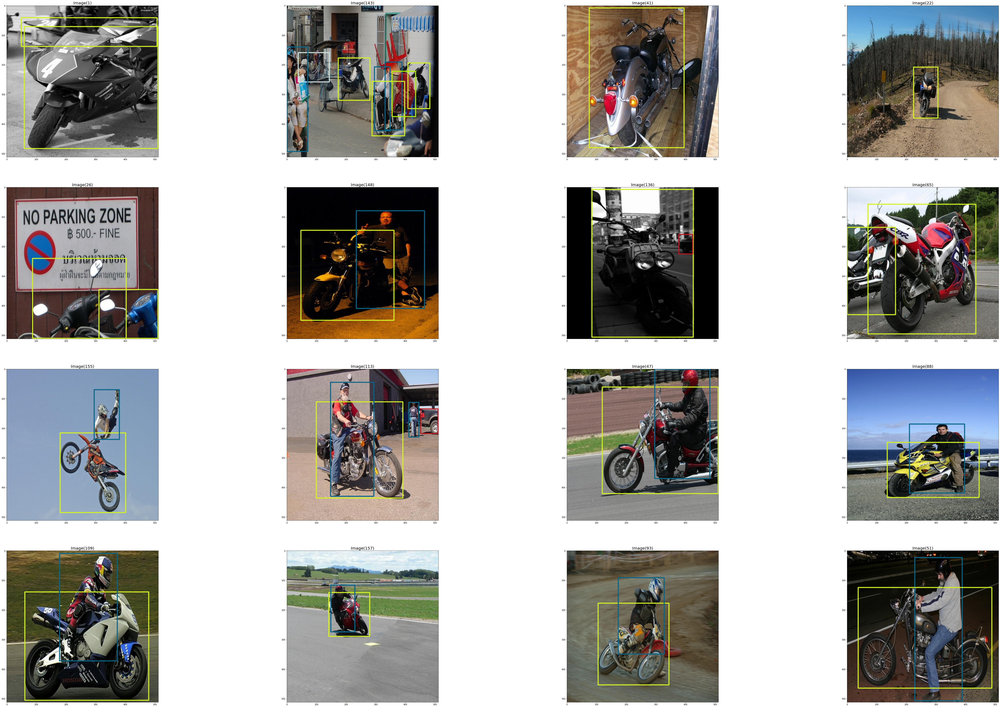

In [16]:
dataset.show_images()

### 2.3 Train with HPO

In [17]:
time_limit = 60*5  # 5min
hyperparameters = {'epochs': 3, 'batch_size': 8}
hyperparamter_tune_kwargs={'num_trials': 2}
detector = ObjectDetector().fit(train, val, time_limit=time_limit,
                                hyperparameters=hyperparameters,
                                hyperparamter_tune_kwargs=hyperparamter_tune_kwargs)

INFO:gluoncv.auto.tasks.object_detection:Starting fit without HPO
INFO:SSDEstimator:modified configs(<old> != <new>): {
INFO:SSDEstimator:root.ssd.data_shape  300 != 512
INFO:SSDEstimator:root.ssd.base_network vgg16_atrous != resnet50_v1
INFO:SSDEstimator:root.num_workers     4 != 32
INFO:SSDEstimator:root.dataset_root    ~/.mxnet/datasets/ != auto
INFO:SSDEstimator:root.train.epochs    20 != 3
INFO:SSDEstimator:root.train.seed      233 != 423
INFO:SSDEstimator:root.train.batch_size 16 != 8
INFO:SSDEstimator:root.valid.batch_size 16 != 8
INFO:SSDEstimator:root.dataset         voc_tiny != auto
INFO:SSDEstimator:}
INFO:SSDEstimator:Saved config to /home/ec2-user/SageMaker/646db69b/.trial_0/config.yaml
INFO:SSDEstimator:Using transfer learning from ssd_512_resnet50_v1_coco, the other network parameters are ignored.
INFO:SSDEstimator:Start training from [Epoch 0]
INFO:SSDEstimator:[Epoch 0] Training cost: 9.339669, CrossEntropy=3.614755, SmoothL1=1.123091
INFO:SSDEstimator:[Epoch 0] Valida

### 2.3 Localize objects in test images

In [18]:
test_img = test.iloc[0]['image']
prediction = detector.predict(test_img)
prediction.head()

INFO:numexpr.utils:Note: NumExpr detected 32 cores but "NUMEXPR_MAX_THREADS" not set, so enforcing safe limit of 8.
INFO:numexpr.utils:NumExpr defaulting to 8 threads.


,predict_class,predict_score,predict_rois
0,person,0.754206,"{'xmin': 0.17069993913173676, 'ymin': 0.0, 'xm..."
1,motorbike,0.450674,"{'xmin': 0.06669089198112488, 'ymin': 0.423723..."
2,motorbike,0.449816,"{'xmin': 0.01888321340084076, 'ymin': 0.674700..."
3,person,0.335083,"{'xmin': 0.5839815735816956, 'ymin': 0.0108514..."
4,motorbike,0.282113,"{'xmin': 0.5463107228279114, 'ymin': 0.7381194..."
